Creating stochastic block model graph (p currently hard coded in function)

In [1]:
import networkx as nx
import random
import matplotlib.pyplot as plt

def create_network(n, alpha_s):
    # Define the number of nodes in each block
    n_left = n // 2
    n_right = n - n_left
    
    # Define the block sizes and probabilities
    block_sizes = [n_left, n_right]
    p_in = alpha_s * (1/150)
    p_out = (2 - alpha_s) * (1/150)
    
    #print(block_sizes)
    #print(p_in)
    #print(p_out)
    
    # Create a stochastic block model graph
    #try:
    G = nx.stochastic_block_model(block_sizes, [[p_in, p_out], [p_out, p_in]])
    #except:
    #    G = nx.stochastic_block_model(block_sizes, [[2*(1/150), 0], [0, 2*(1/150)]])

    # Assign "left" or "right" attribute to nodes
    for i, node in enumerate(G):
        if i < n_left: 
            G.nodes[node]['wing'] = 'left'
        else:
            G.nodes[node]['wing'] = 'right'
            
    return G

When building the above function/graph below, the average degree will be determined by p and n. The average degree will be p * n, and so the average number of edges will be half of this.

Number of nodes in the network: 600
Number of edges in the network: 1130


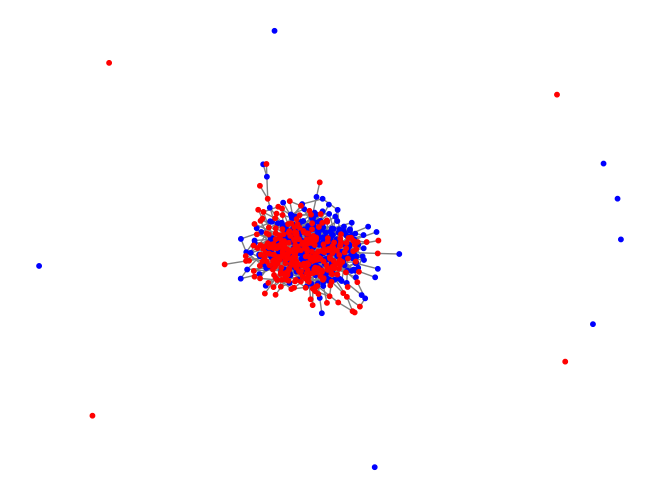

In [2]:
n = 600  # Number of nodes

# Between 1 and 2
alpha_s = 1.5
G = create_network(n, alpha_s)

print("Number of nodes in the network:", G.number_of_nodes())
print("Number of edges in the network:", G.number_of_edges())

# Convert 'wing' attribute values to colors
node_colors_G = ['blue' if G.nodes[node]['wing'] == 'left' else 'red' for node in G.nodes()]

# Plot the graph with colors based on the "wing" attribute
nx.draw(G, node_color=node_colors_G, node_size=10, edge_color='gray')

In [3]:
def misinfo_spread(G, pi_left, pi_right, mis_count_scale = 1, missing_count=True, info=True):

    # Make a copy so we don't effect original graph
    G_new = G.copy()
    
    # Determine whether nodes are active based on pi
    for node in G_new.nodes:
        if G_new.nodes[node]['wing'] == 'left':
            if random.random() < pi_left:
                G_new.nodes[node]['active'] = False
            else:
                G_new.nodes[node]['active'] = True
        elif G_new.nodes[node]['wing'] == 'right':
            if random.random() < pi_right:
                G_new.nodes[node]['active'] = False
            else:
                G_new.nodes[node]['active'] = True
                
    
    infected_nodes = set()
    t = 0
    mis_count = 0
    
    
    # Set all nodes as uninfected
    for node in G_new.nodes():
        G_new.nodes[node]['infected'] = False
    
    
    # Choose one node with wing='right' from the largest component to randomly to start the spread
    connected_components = list(nx.connected_components(G_new))
    largest_component = max(connected_components, key=len)
    # Adding try/except for max homophily case
    try:
        random_right_node = random.choice([node for node, attrs in G_new.nodes(data=True) if (node in largest_component) and (attrs['wing'] == 'right') and (attrs['active'] == True)])
    except:
        random_right_node = random.choice([node for node, attrs in G_new.nodes(data=True) if (attrs['wing'] == 'right') and (attrs['active'] == True)])
    infected_nodes.add(random_right_node)
    G_new.nodes[random_right_node]['infected'] = True
    
    
    # Iterate over time periods until no new person spreads fake news
    new_infections = set()
    new_infections.add(random_right_node)
    mis_count_nodes = set()
    
    while True:
        t += 1

        # Defining sets as new_infections cannot be updated during the loop
        nodes_to_remove = set()
        nodes_to_add = set()
        
        # Iterate over infected nodes and infect their neighbors if they are active
        for node in new_infections:
            # Remove node from infections so each node only has one chance to spread fake news
            nodes_to_remove.add(node)
            for neighbor in G_new.neighbors(node):
                if neighbor not in infected_nodes and neighbor not in new_infections:
                    if G_new.nodes[neighbor]['active'] == True:
                        if missing_count:
                            # Reduce infection probability based on proportion of missing count clicks
                            count_proportion = mis_count/len(G_new)
                            if random.random() > count_proportion * mis_count_scale:
                                G_new.nodes[neighbor]['infected'] = True
                                nodes_to_add.add(neighbor)
                            else:
                                # DO I NEED TO CHECK THIS, SHOULD THEY BE ABLE TO GET HERE IF THEY ARE IN MIS_COUNT_NODES
                                # I SHOULDN'T NEED THIS IF CONDITION, CHECK IF IT AFFECTS THE GRAPHS IN ANY WAY!
                                # if neighbor not in mis_count_nodes: - Vika: yes, this is not needed 
                                    mis_count += 1
                                    mis_count_nodes.add(neighbor)
                                    # After adding to missing count the node becomes inactive
                                    G_new.nodes[neighbor]['active'] = False
                        else:
                            G_new.nodes[neighbor]['infected'] = True
                            nodes_to_add.add(neighbor)
                           
                    else: # Vika: I changed this condition so that it's more clear what's going on
                         # If neighbor is not active then they add to the missing count
                        if missing_count and neighbor not in mis_count_nodes:
                            mis_count += 1
                            mis_count_nodes.add(neighbor)
                            G_new.nodes[neighbor]['active'] = False
            
            # Update the list of infected nodes so one node is not counted twice
            infected_nodes.update(nodes_to_add)
            
        # Remove all nodes which have shared fake news (as only one shot to infect)                
        new_infections.difference_update(nodes_to_remove)
        new_infections.update(nodes_to_add)
                              
        if not new_infections:
            break
            
    
    if info:
        print("Simulation lasted " + str(t) + " periods")
        if missing_count:
            print("Missing count at end of simulation: " + str(mis_count))
            print("Missing count (proportion of network): " + str(mis_count/len(G_new)))
        print("Number of people sharing fake news: " + str(len(infected_nodes)))
        print("Proportion of people sharing fake news: " + str(len(infected_nodes)/len(G_new)))
        
    return G_new


Note in the above the chosen node to start the infection will always be from the giant component

Note that when someone adds to the missing count they become inactive!

WHY CAN THE PROPORTION OF PEOPLE ADDING TO THE MISSING COUNT AND THE PEOPLE SHARING FAKE NEWS ADD TO MORE THAN ONE?
Must mean people are either sharing fake news then adding to the missing count later...?

In [43]:
# Simulate misinfo spread
G_sim = misinfo_spread(G, 0.7, 0.2, missing_count=True)

Simulation lasted 13 periods
Missing count at end of simulation: 244
Missing count (proportion of network): 0.4066666666666667
Number of people sharing fake news: 234
Proportion of people sharing fake news: 0.39


In [122]:
G_sim.nodes(data=True)

NodeDataView({0: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 1: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 2: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 3: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 4: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 5: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 6: {'block': 0, 'wing': 'left', 'active': True, 'infected': True}, 7: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 8: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 9: {'block': 0, 'wing': 'left', 'active': True, 'infected': True}, 10: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 11: {'block': 0, 'wing': 'left', 'active': True, 'infected': True}, 12: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 13: {'block': 0, 'wing': 'left', 'active': False, 'infected': False}, 14: {'block': 0, 'wing

In [4]:
# Function to calculate the reach of misinformation
def reach_calculator(G):
    nodes_reached = set()
    for node in G.nodes():
    # Check if the node has the specific attribute
        if G.nodes[node]['infected'] == True:
            neighbors = G.neighbors(node)
            nodes_reached.add(node)
            nodes_reached.update(neighbors)
            
    return len(nodes_reached)

In [5]:
def reach_calculator_paper(G):
    nodes_reached = set()
    for node in G.nodes():
        # Check if the node has the specific attribute 'infected' and 'active'
        if G.nodes[node]['infected'] == True:
            neighbors = G.neighbors(node)
            # Add only neighbors with the 'active' attribute set to True
            for neighbor in neighbors:
                if G.nodes[neighbor]['active'] == True:
                    nodes_reached.add(neighbor)
            
    return len(nodes_reached)

In [6]:
# Function to calculate the influence of misinformation
def influence_calculator(G):
    nodes_influenced = 0
    for node in G.nodes():
        if G.nodes[node]['wing'] == 'left' and G.nodes[node]['infected'] == True:
            nodes_influenced += 1
            
    return nodes_influenced

In [7]:
# For a given graph, sim the misinformation spread and calculate the difference in reach and influence, along with the base reach and influence.
def pol_effect(G, pi_left, pi_right, mis_count_scale):
    G_pol = misinfo_spread(G, pi_left, pi_right, mis_count_scale, missing_count=True, info=False)
    G_no_pol = misinfo_spread(G, pi_left, pi_right, mis_count_scale, missing_count=False, info=False)

    paper_reach = reach_calculator_paper(G_no_pol)
    reach = reach_calculator(G_no_pol)
    influence = influence_calculator(G_no_pol)
    paper_reach_diff = reach_calculator_paper(G_no_pol) - reach_calculator_paper(G_pol)
    reach_diff = reach_calculator(G_no_pol) - reach_calculator(G_pol)
    influence_diff = influence_calculator(G_no_pol) - influence_calculator(G_pol)

    return paper_reach, reach, influence, paper_reach_diff, reach_diff, influence_diff

In [11]:
# Plot different levels of alpha, finding the reach and influence without the policy, and then the effectivness of the policy
import numpy as np
from statistics import mean

def vary_alpha(pi_left, pi_right, mis_count_scale=1):
    alpha_list = []
    paper_reach_list = []
    reach_list = []
    influence_list = []
    paper_reach_diff_list = []
    reach_diff_list = []
    influence_diff_list = []

    for alpha in np.arange(1, 2.05, 0.05):
        local_paper_reach_list = []
        local_reach_list = []
        local_influence_list = []
        local_paper_reach_diff_list = []
        local_reach_diff_list = []
        local_influence_diff_list = []
        # Generate graph 10 times for each alpha to average over
        for i in range(500):
            G = create_network(600, round(alpha, 2))

            # See reach, influence and effectiveness of policy
            paper_reach, reach, influence, paper_reach_diff, reach_diff, influence_diff = pol_effect(G, pi_left, pi_right, mis_count_scale)

            # Add to lists for plotting
            local_paper_reach_list.append(paper_reach)
            local_reach_list.append(reach)
            local_influence_list.append(influence)
            local_paper_reach_diff_list.append(paper_reach_diff)
            local_reach_diff_list.append(reach_diff)
            local_influence_diff_list.append(influence_diff)

        alpha_list.append(round(alpha, 2))
        paper_reach_list.append(mean(local_paper_reach_list))
        reach_list.append(mean(local_reach_list))
        influence_list.append(mean(local_influence_list))
        paper_reach_diff_list.append(mean(local_paper_reach_diff_list))
        reach_diff_list.append(mean(local_reach_diff_list))
        influence_diff_list.append(mean(local_influence_diff_list))

    return alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list


In [9]:
from scipy.stats import linregress
from scipy.optimize import curve_fit

def plot_two_lines(alpha_list, list1, list2, title1: str, title2: str, degree=2):
    fig, ax1 = plt.subplots()

    color = 'tab:blue'
    ax1.set_xlabel('Level of homophily')
    ax1.set_ylabel(title1, color=color)
    ax1.plot(alpha_list, list1, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()

    color = 'tab:red'
    ax2.set_ylabel(title2, color=color)
    ax2.plot(alpha_list, list2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    ax1.grid(True)

    # Fit polynomial curves
    p1 = np.polyfit(alpha_list, list1, degree)
    trend_line1 = np.polyval(p1, alpha_list)
    ax1.plot(alpha_list, trend_line1, linestyle='--', color='blue')

    p2 = np.polyfit(alpha_list, list2, degree)
    trend_line2 = np.polyval(p2, alpha_list)
    ax2.plot(alpha_list, trend_line2, linestyle='--', color='red')

    plt.show()

In [10]:
from scipy.optimize import curve_fit

# With no line trough max points
def plot_pi_trends(alpha_list, pi_dict, y_label, degree=2):
    fig, ax = plt.subplots()

    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

    for i, (key, list) in enumerate(pi_dict.items()):
        p = np.polyfit(alpha_list, list, degree)
        trend_line = np.polyval(p, alpha_list)
        ax.plot(alpha_list, trend_line, linestyle='--', color=colors[i], label=f'pi[1] = {key}')

    ax.set_xlabel('Level of homophily')
    ax.set_ylabel(y_label)
    ax.grid(True)
    ax.legend()
    plt.show()

Params we can alter:
- the original infection p (currently 0.01)
- the effectivness of the policy
- the values of pi

Base left pi is 0.9, base right pi is 0.5. Plot graphs for these values

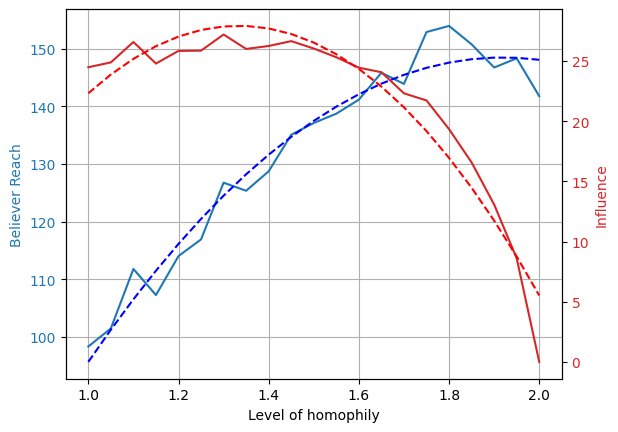

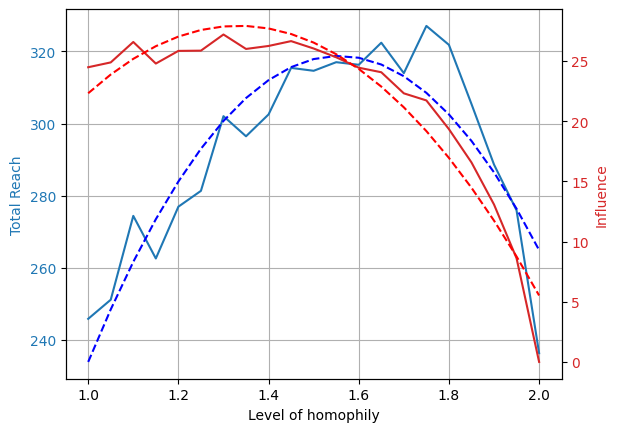

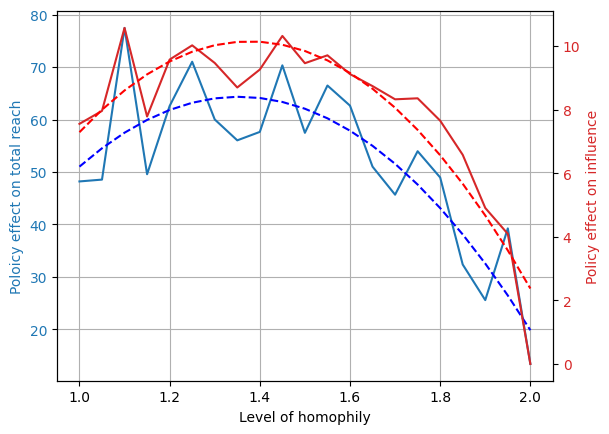

In [12]:
pi_left = 0.8
pi_right = 0.4

# Run simulations
alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi_left, pi_right)

# Plot believer reach and influence
plot_two_lines(alpha_list, paper_reach_list, influence_list, "Believer Reach", "Influence")

# Plot total reach and influence
plot_two_lines(alpha_list, reach_list, influence_list, "Total Reach", "Influence")

# Plot pol effect on total reach and influence
plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Poloicy effect on total reach", "Policy effect on influence")

Holding left pi constant, how does changing right pi influence the results

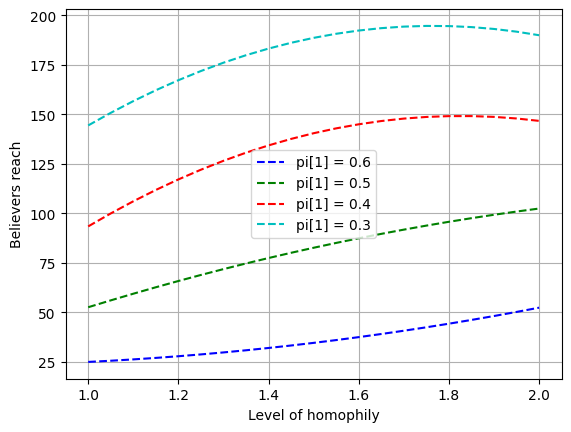

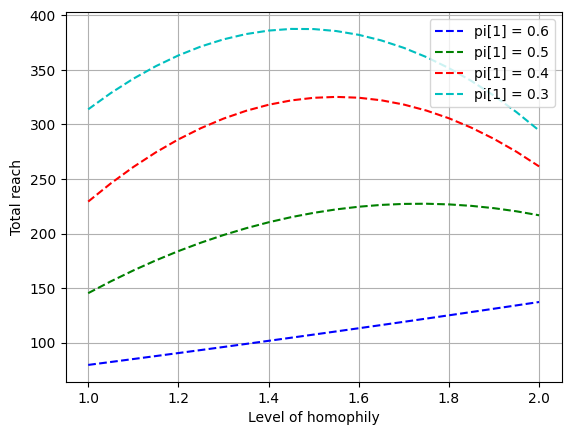

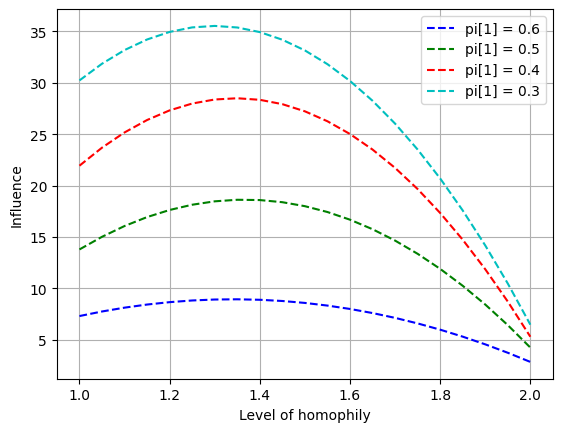

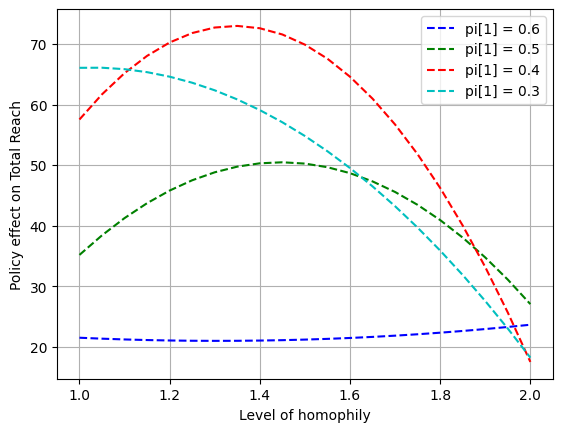

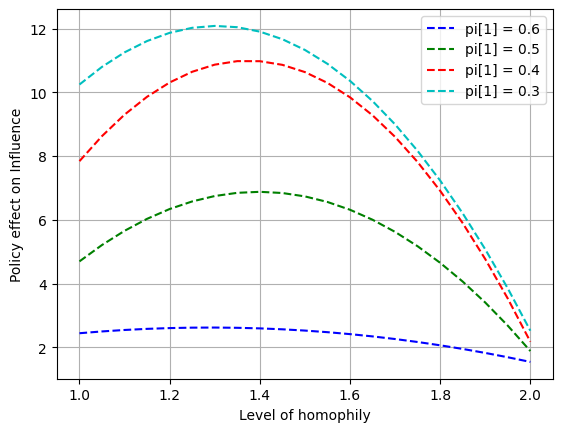

In [13]:
# Results for believers reach

pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3]]

pi_paper_reach_dict = {}
pi_reach_dict = {}
pi_influence_dict = {}
pi_reach_diff_dict = {}
pi_influence_diff_dict = {}

for pi in pi_try:
    alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1])
    pi_paper_reach_dict[pi[1]] = paper_reach_list
    pi_reach_dict[pi[1]] = reach_list
    pi_influence_dict[pi[1]] = influence_list
    pi_reach_diff_dict[pi[1]] = reach_diff_list
    pi_influence_diff_dict[pi[1]] = influence_diff_list

# Add this at the end of your loop
plot_pi_trends(alpha_list, pi_paper_reach_dict, 'Believers reach')
plot_pi_trends(alpha_list, pi_reach_dict, 'Total reach')
plot_pi_trends(alpha_list, pi_influence_dict, 'Influence')
plot_pi_trends(alpha_list, pi_reach_diff_dict, 'Policy effect on Total Reach')
plot_pi_trends(alpha_list, pi_influence_diff_dict, 'Policy effect on Influence')

DONT RUN BELOW HERE

In [ ]:
# Results for total reach

pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3]]

pi_dict = {}

for pi in pi_try:
    alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1])
    pi_dict[pi[1]] = paper_reach_list

# Add this at the end of your loop
plot_pi_trends(pi_dict)

In [ ]:
# Results for believers reach

pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3]]

pi_dict = {}

for pi in pi_try:
    alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1])
    pi_dict[pi[1]] = paper_reach_list

# Add this at the end of your loop
plot_pi_trends(pi_dict)

# OLD CODE BELOW HERE

Loop changing the effectiveness of the policy, and the levels of pi, to see if for this graph set up we can achieve any sensible results

In [53]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3], [0.8, 0.2], [0.8, 0.1]]
scales = [1]
reach_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left pi: " + str(pi[0]) +" Right pi: " + str(pi[1]))
        print("Missing count scale: " + str(scale))
        print("If only active people in GC:")
        plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        print("If active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        print("With policy reduction, if active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")



### Our reach

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.6
If active and non-active people in GC:


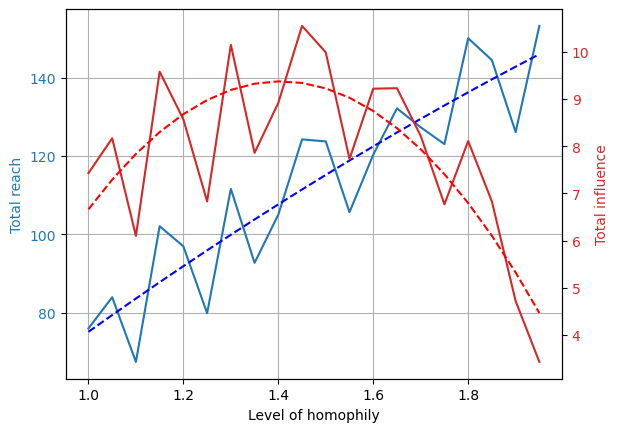

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If active and non-active people in GC:


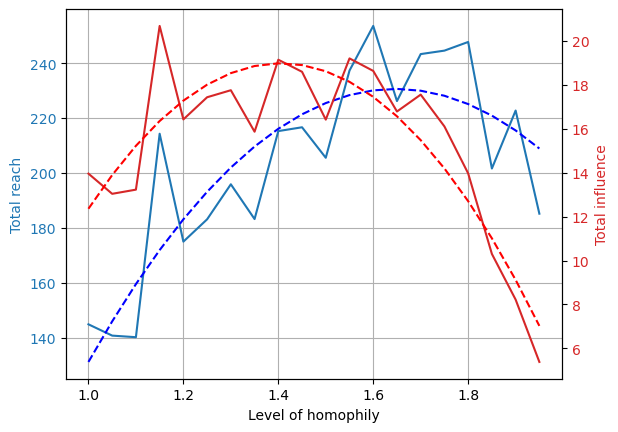

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.4
If active and non-active people in GC:


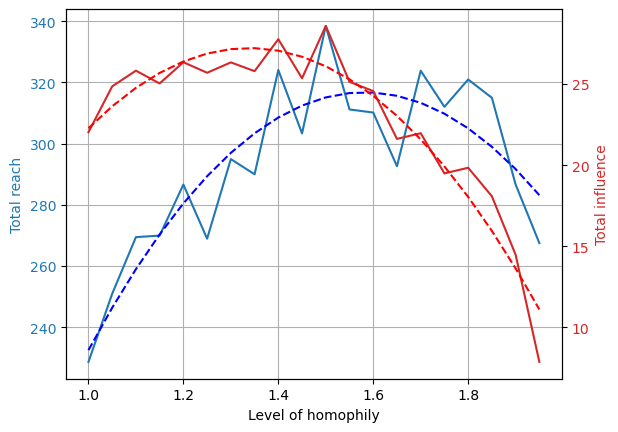

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.3
If active and non-active people in GC:


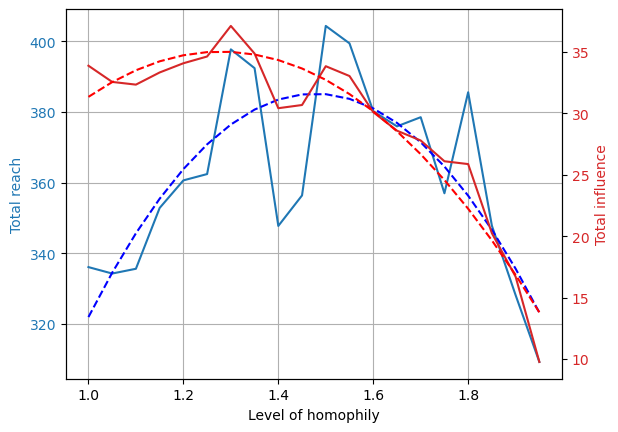

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.2
If active and non-active people in GC:


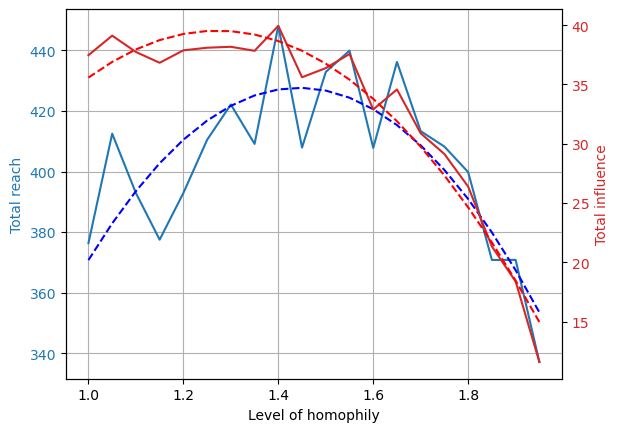

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.1
If active and non-active people in GC:


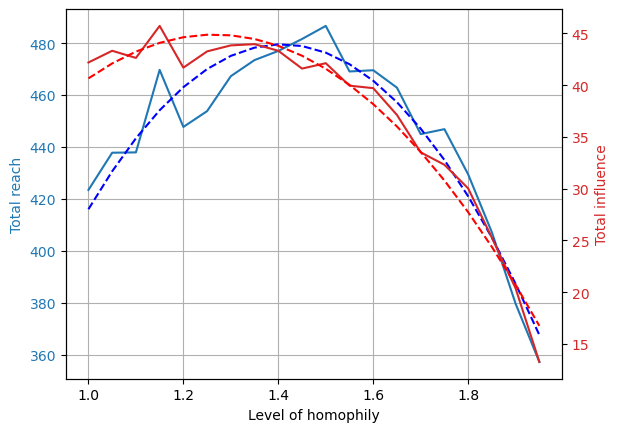

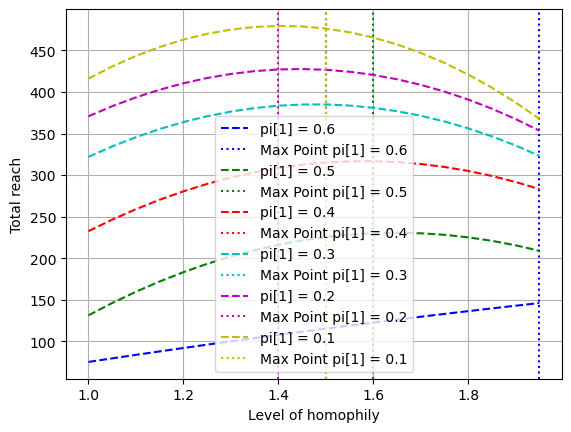

In [57]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3], [0.8, 0.2], [0.8, 0.1]]
# scales = [1]
reach_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        reach_dict[pi[1]] = reach_list
        # print("If only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        print("If active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(reach_dict)
        

### Paper reach

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.6
If only active people in GC:


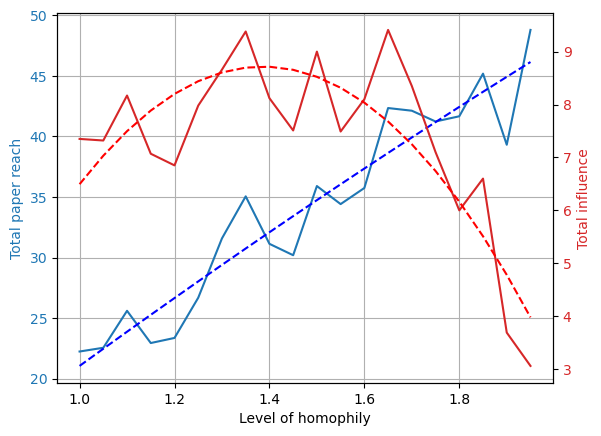

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If only active people in GC:


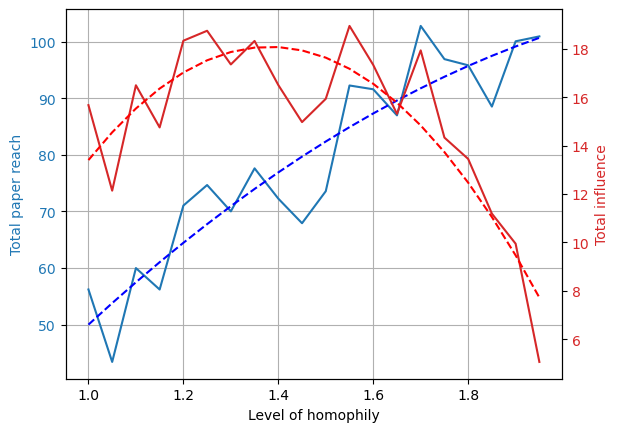

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.4
If only active people in GC:


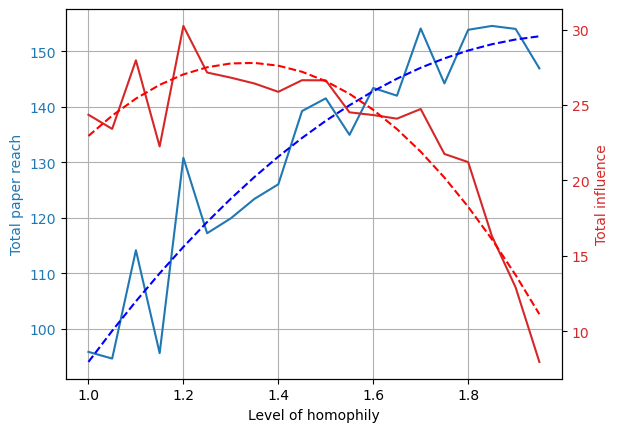

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.3
If only active people in GC:


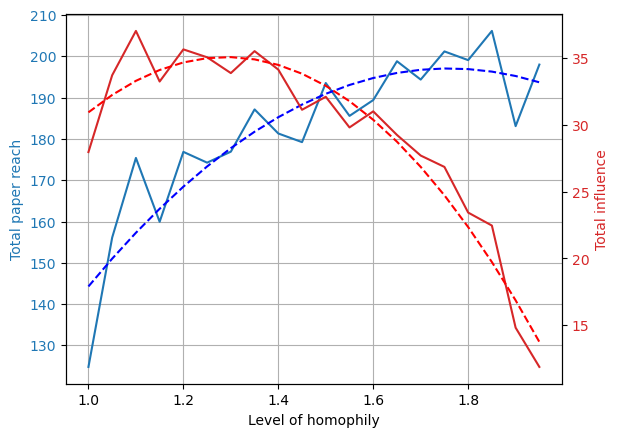

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.2
If only active people in GC:


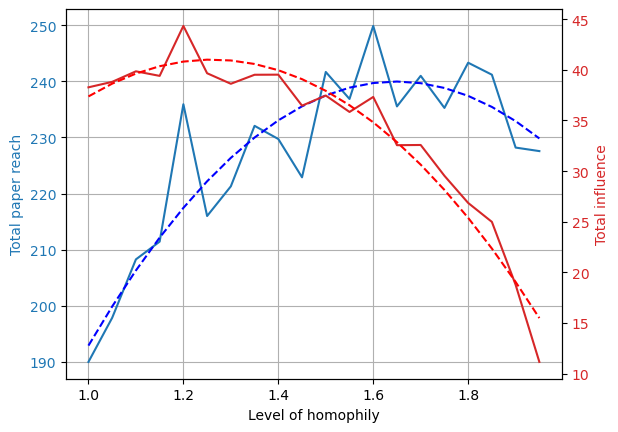

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.1
If only active people in GC:


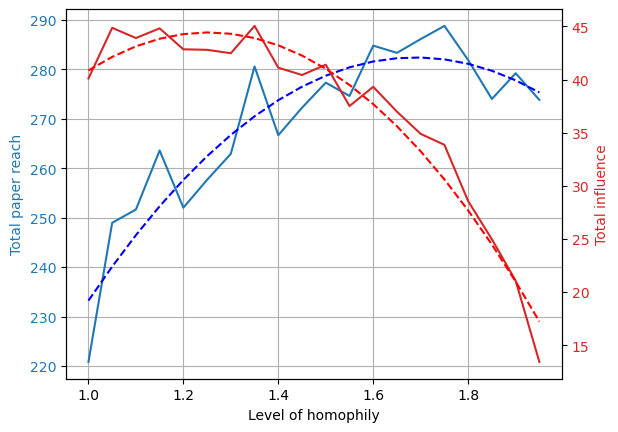

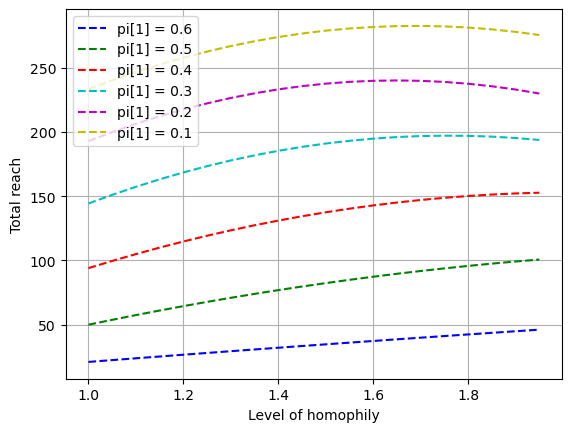

In [55]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3], [0.8, 0.2], [0.8, 0.1]]
# scales = [1]
reach_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        reach_dict[pi[1]] = paper_reach_list
        print("If only active people in GC:")
        plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        # print("If active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(reach_dict)
        

### Our Influence

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.6
If active and non-active people in GC:


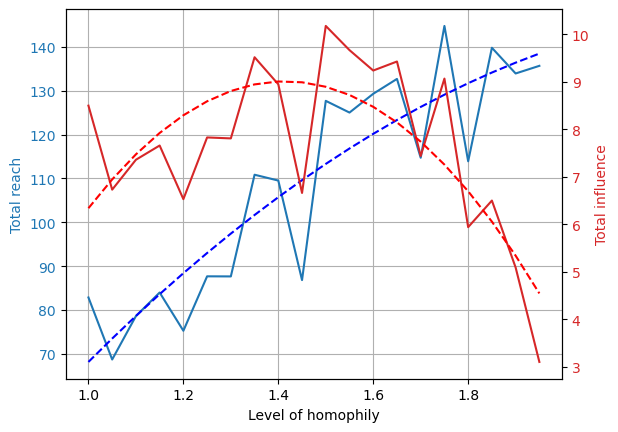

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If active and non-active people in GC:


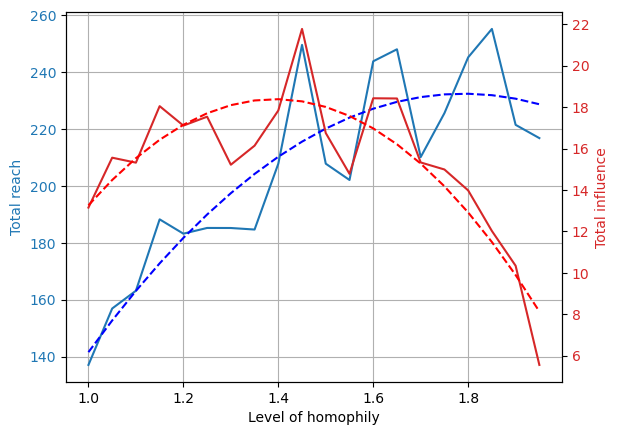

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.4
If active and non-active people in GC:


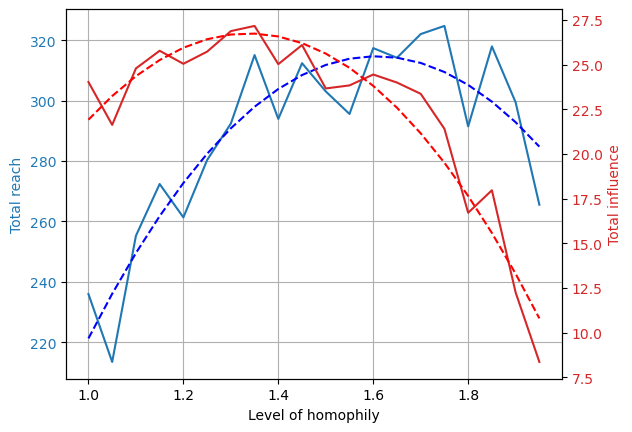

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.3
If active and non-active people in GC:


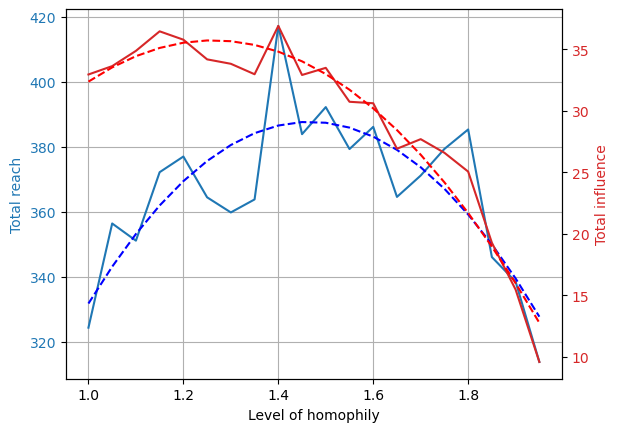

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.2
If active and non-active people in GC:


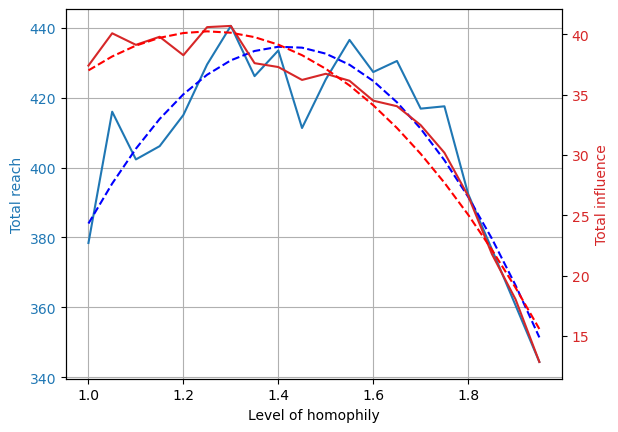

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.1
If active and non-active people in GC:


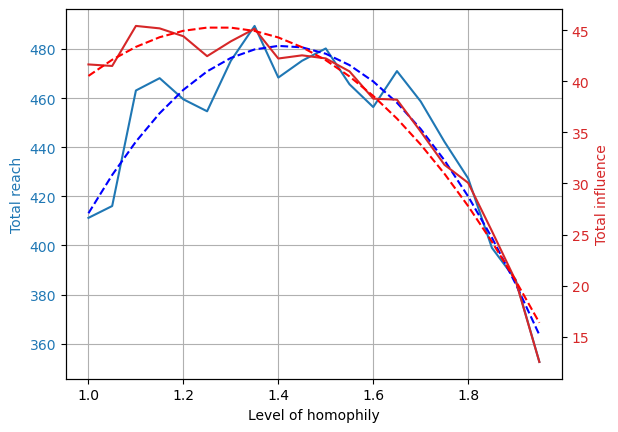

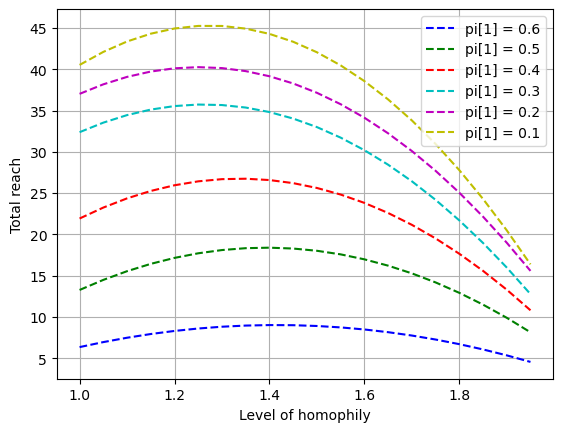

In [60]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.8, 0.6], [0.8, 0.5], [0.8, 0.4], [0.8, 0.3], [0.8, 0.2], [0.8, 0.1]]
# scales = [1]
influence_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        influence_dict[pi[1]] = influence_list
        # print("If only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        print("If active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(influence_dict)
        

### Same again but now holding the right wing pi constant and varying the left wing pi

### Our reach

Left fraction of non-believers: 0.9 Right fraction of non-believers: 0.5
If active and non-active people in GC:


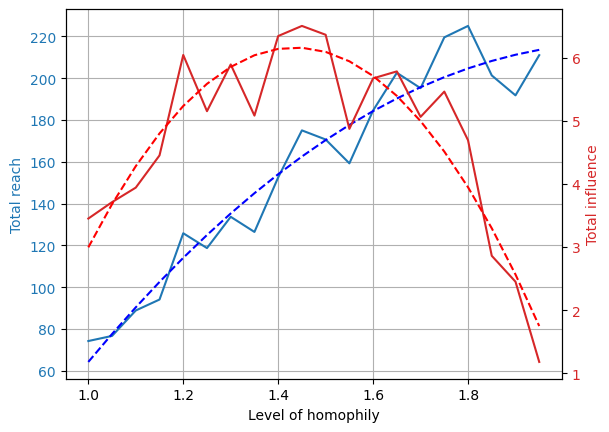

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If active and non-active people in GC:


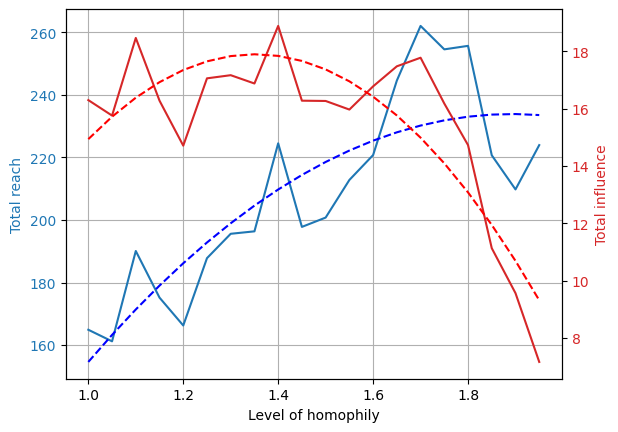

Left fraction of non-believers: 0.7 Right fraction of non-believers: 0.5
If active and non-active people in GC:


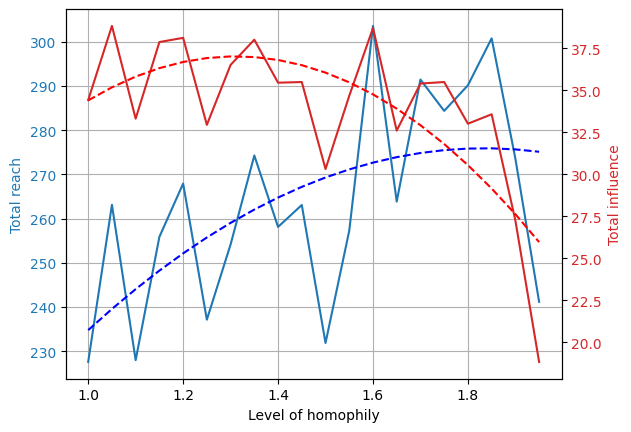

Left fraction of non-believers: 0.6 Right fraction of non-believers: 0.5
If active and non-active people in GC:


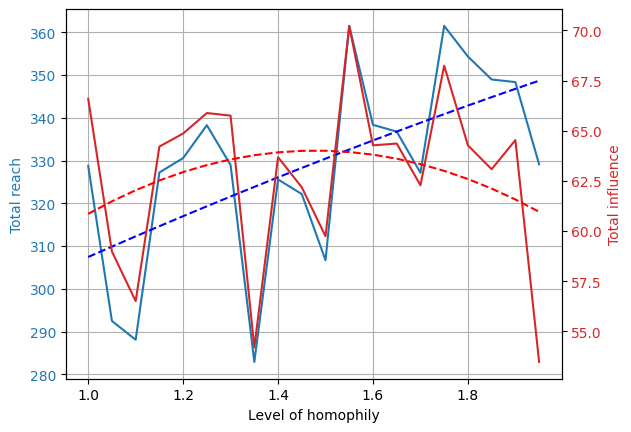

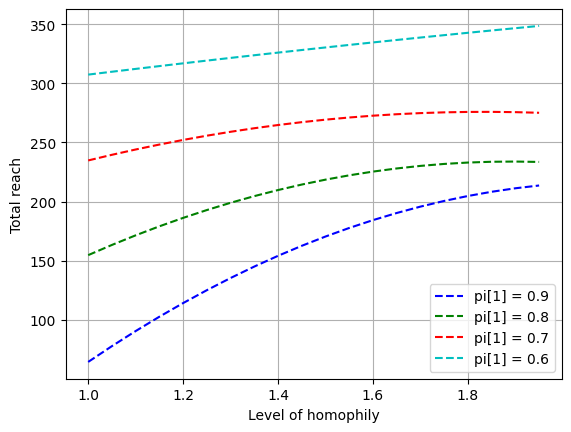

In [13]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.9, 0.5], [0.8, 0.5], [0.7, 0.5], [0.6, 0.5]]
scales = [1]
reach_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        reach_dict[pi[0]] = reach_list
        # print("If only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        print("If active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(reach_dict)

### Paper reach

Left fraction of non-believers: 0.9 Right fraction of non-believers: 0.5
If only active people in GC:


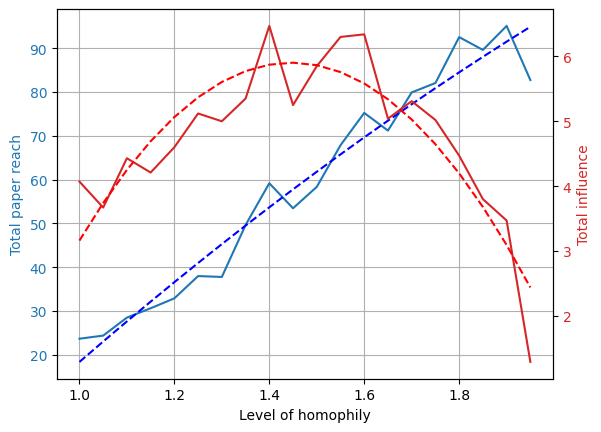

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If only active people in GC:


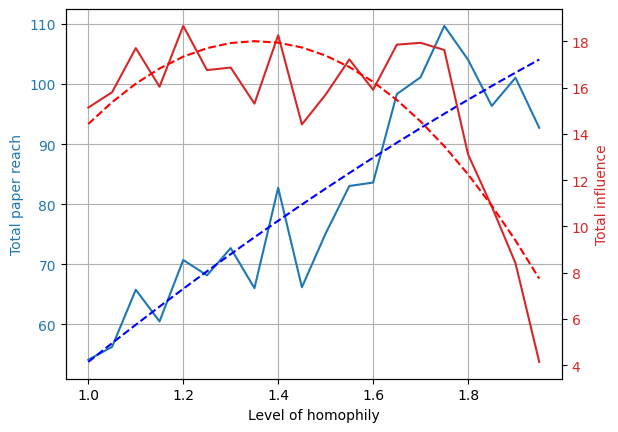

Left fraction of non-believers: 0.7 Right fraction of non-believers: 0.5
If only active people in GC:


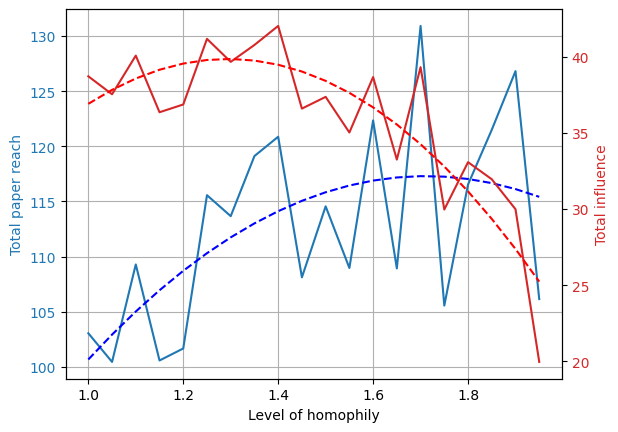

Left fraction of non-believers: 0.6 Right fraction of non-believers: 0.5
If only active people in GC:


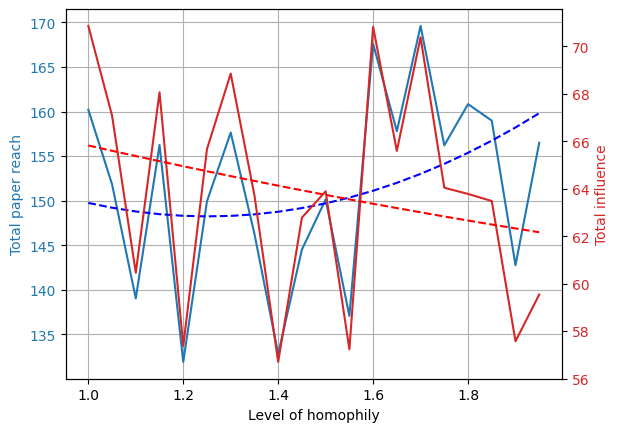

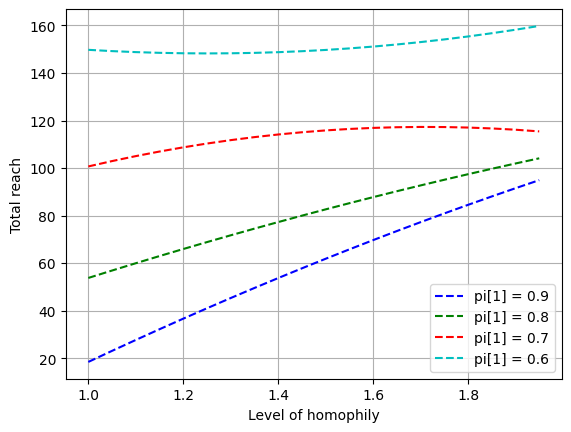

In [14]:
pi_try = [[0.9, 0.5], [0.8, 0.5], [0.7, 0.5], [0.6, 0.5]]
scales = [1]
reach_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        reach_dict[pi[0]] = paper_reach_list
        print("If only active people in GC:")
        plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        # print("If active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(reach_dict)

### Our influence

Left fraction of non-believers: 0.9 Right fraction of non-believers: 0.5
If active and non-active people in GC:


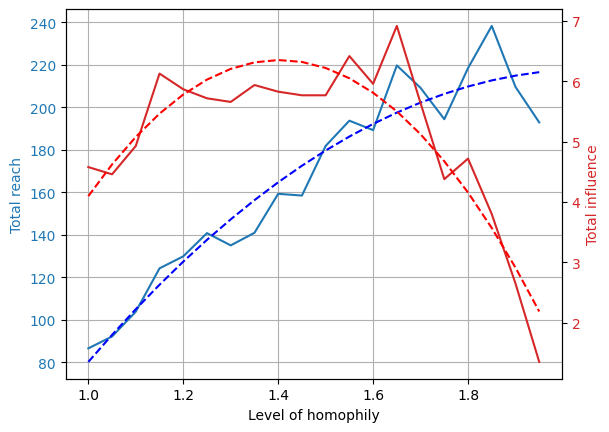

Left fraction of non-believers: 0.8 Right fraction of non-believers: 0.5
If active and non-active people in GC:


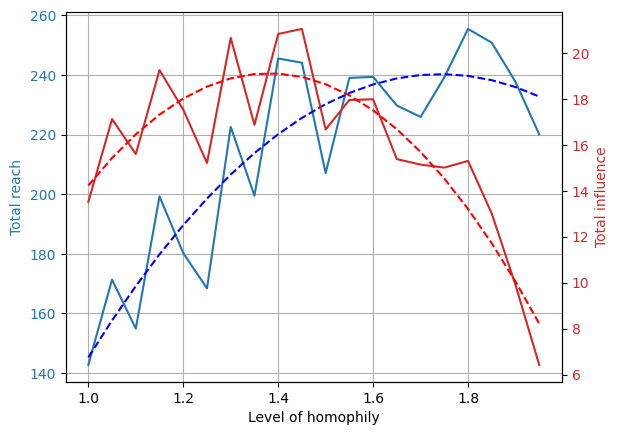

Left fraction of non-believers: 0.7 Right fraction of non-believers: 0.5
If active and non-active people in GC:


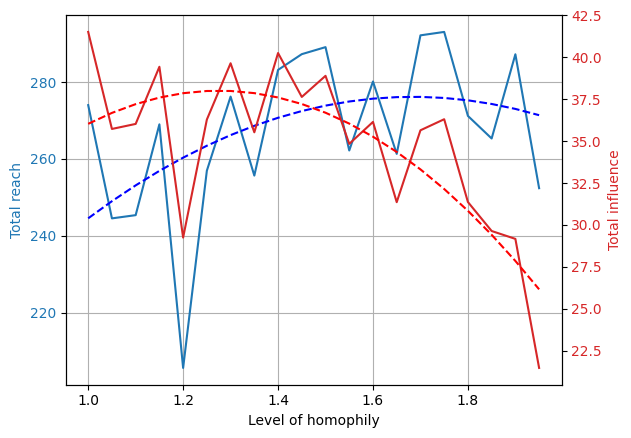

Left fraction of non-believers: 0.6 Right fraction of non-believers: 0.5
If active and non-active people in GC:


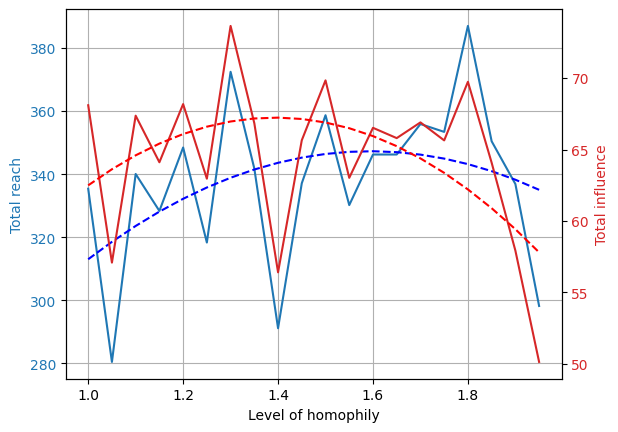

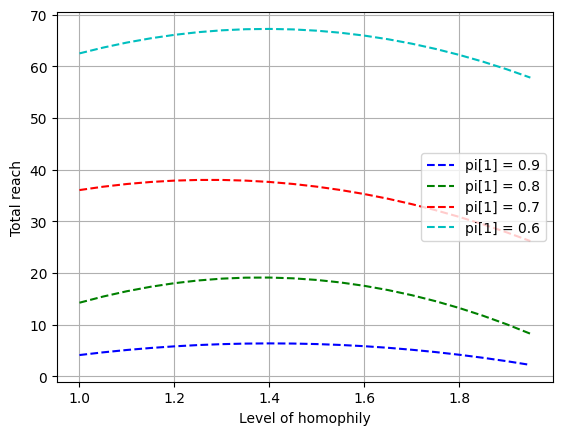

In [15]:
# pi_try = [[0.9, 0.5], [0.5, 0.5], [0.95, 0.05], [0.75, 0.25], [0.65, 0.4]]
pi_try = [[0.9, 0.5], [0.8, 0.5], [0.7, 0.5], [0.6, 0.5]]
scales = [1]
influence_dict = {}

for pi in pi_try:
    for scale in scales:
        alpha_list, paper_reach_list, reach_list, influence_list, paper_reach_diff_list, reach_diff_list, influence_diff_list = vary_alpha(pi[0], pi[1], scale)
        print("Left fraction of non-believers: " + str(pi[0]) +" Right fraction of non-believers: " + str(pi[1]))
        # print("Missing count scale: " + str(scale))
        influence_dict[pi[0]] = influence_list
        # print("If only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_list, influence_list, "Total paper reach", "Total influence")
        print("If active and non-active people in GC:")
        plot_two_lines(alpha_list, reach_list, influence_list, "Total reach", "Total influence")
        # print("With policy reduction, only active people in GC:")
        # plot_two_lines(alpha_list, paper_reach_diff_list, influence_diff_list, "Policy reduction on paper reach", "Policy reduction on influence")
        # print("With policy reduction, if active and non-active people in GC:")
        # plot_two_lines(alpha_list, reach_diff_list, influence_diff_list, "Policy reduction on reach", "Policy reduction on influence")

# Add this at the end of your loop
plot_reach_trends(influence_dict)

### Running our model on facebook data

Question: What facebook data do we want to use?

In [2]:
# Load facebook data
from scipy.io import mmread
a = mmread("C:/Users/gatla/OneDrive/BSE/Networks_1/socfb-American75/socfb-American75.mtx")
fb_real = nx.Graph(a)

c:\Users\gatla\anaconda3\envs\ml_project1\Lib\site-packages\networkx\drawing\nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


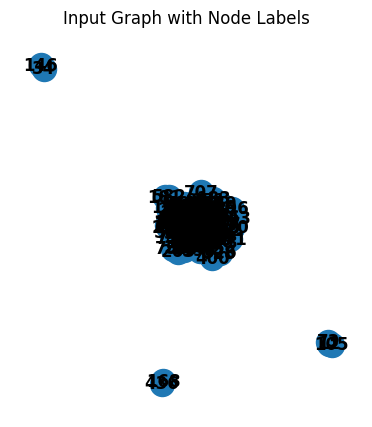

In [1]:
# Angelo facebook data

import networkx as nx
from scipy.io import loadmat
import matplotlib.pyplot as plt

# # Mount Google Drive
# drive.mount('/content/drive')

# Read the MAT file
data = loadmat("C:/Users/gatla/OneDrive/BSE/Networks_1/facebook100/facebook100/Caltech36.mat")

# Extract relevant information from the dictionary
# For example, if the data contains adjacency matrix stored as 'A' key:
adjacency_matrix = data['A']

# Create a graph using networkx
G = nx.Graph(adjacency_matrix)

# Visualize the input graph
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 5))

plt.subplot(121)
nx.draw(G, pos, with_labels=True, font_weight='bold', cmap=plt.cm.Paired)
plt.title('Input Graph with Node Labels')

plt.show()

In [2]:
len(G)

769

In [81]:
len(fb_real)

6386

In [82]:
fb_real.nodes(data=True)

NodeDataView({0: {}, 1: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 16: {}, 17: {}, 18: {}, 19: {}, 20: {}, 21: {}, 22: {}, 23: {}, 24: {}, 25: {}, 26: {}, 27: {}, 28: {}, 29: {}, 30: {}, 31: {}, 32: {}, 33: {}, 34: {}, 35: {}, 36: {}, 37: {}, 38: {}, 39: {}, 40: {}, 41: {}, 42: {}, 43: {}, 44: {}, 45: {}, 46: {}, 47: {}, 48: {}, 49: {}, 50: {}, 51: {}, 52: {}, 53: {}, 54: {}, 55: {}, 56: {}, 57: {}, 58: {}, 59: {}, 60: {}, 61: {}, 62: {}, 63: {}, 64: {}, 65: {}, 66: {}, 67: {}, 68: {}, 69: {}, 70: {}, 71: {}, 72: {}, 73: {}, 74: {}, 75: {}, 76: {}, 77: {}, 78: {}, 79: {}, 80: {}, 81: {}, 82: {}, 83: {}, 84: {}, 85: {}, 86: {}, 87: {}, 88: {}, 89: {}, 90: {}, 91: {}, 92: {}, 93: {}, 94: {}, 95: {}, 96: {}, 97: {}, 98: {}, 99: {}, 100: {}, 101: {}, 102: {}, 103: {}, 104: {}, 105: {}, 106: {}, 107: {}, 108: {}, 109: {}, 110: {}, 111: {}, 112: {}, 113: {}, 114: {}, 115: {}, 116: {}, 117: {}, 118: {}, 119: {}, 120: {}, 121: {}

Task - assign the "wing" attribute (Left or Right), to match the level of homophily put into the function

In [12]:
# Average linking probability in the data
total_probability = fb_real.number_of_edges()
average_probability = 2*(total_probability / (fb_real.number_of_nodes() * (fb_real.number_of_nodes() - 1)))
average_probability

0.01067634981671192

In [3]:
total_probability = G.number_of_edges()
average_probability = 2*(total_probability / (G.number_of_nodes() * (G.number_of_nodes() - 1)))
average_probability

0.05640442132639792

In [13]:
average_degree = sum(dict(fb_real.degree()).values()) / len(fb_real)
average_degree

68.16849357970561

In [4]:
average_degree = sum(dict(G.degree()).values()) / len(G)
average_degree

43.3185955786736

In [7]:
len(fb_real)

6386

In [89]:
# Using built in function
avg_link_prob = nx.average_neighbor_degree(fb_real)
avg_link_prob

{0: 108.56716417910448,
 1: 74.125,
 2: 96.94,
 3: 116.12857142857143,
 4: 116.02439024390245,
 5: 104.41791044776119,
 6: 117.67768595041322,
 7: 97.5,
 8: 104.5909090909091,
 9: 119.56637168141593,
 10: 129.5287356321839,
 11: 152.16129032258064,
 12: 146.9591836734694,
 13: 120.98809523809524,
 14: 87.92105263157895,
 15: 105.29545454545455,
 16: 36.0,
 17: 60.0,
 18: 127.45390070921985,
 19: 98.16,
 20: 141.31428571428572,
 21: 135.65384615384616,
 22: 141.29880478087648,
 23: 129.075,
 24: 136.23809523809524,
 25: 119.0,
 26: 119.14634146341463,
 27: 57.78947368421053,
 28: 144.52830188679246,
 29: 274.45454545454544,
 30: 56.2,
 31: 114.94545454545455,
 32: 102.40425531914893,
 33: 60.857142857142854,
 34: 93.93877551020408,
 35: 132.71428571428572,
 36: 130.28571428571428,
 37: 100.77173913043478,
 38: 78.91666666666667,
 39: 137.99264705882354,
 40: 88.3061224489796,
 41: 132.85454545454544,
 42: 165.01075268817203,
 43: 120.3452380952381,
 44: 67.0,
 45: 94.2439024390244,
 46:

In [90]:
avg_link_prob * 1.5

TypeError: unsupported operand type(s) for *: 'dict' and 'float'

In [86]:
fb_real.number_of_nodes()

6386

In [85]:
fb_real.number_of_edges()

217662

In [ ]:
def assign_wings_based_on_homophily(graph, alpha, max_iterations=100):
    # Initialize wing assignment randomly
    for node in graph.nodes():
        graph.nodes[node]['wing'] = random.choice(['left', 'right'])
    
    # Calculate the average probability of connection across the whole graph
    total_probability = graph.number_of_edges()
    average_probability = total_probability / (graph.number_of_nodes() * (graph.number_of_nodes() - 1))
    
    # Perform iterative refinement of wing assignments
    for _ in range(max_iterations):
        # Keep track of whether any changes were made in this iteration
        changes_made = False
        
        # Assign wings to nodes
        for node in graph.nodes():
            left_wing_prob = 0
            right_wing_prob = 0
            for neighbor in graph.neighbors(node):
                if graph.nodes[neighbor]['wing'] == 'left':
                    left_wing_prob += 1
                elif graph.nodes[neighbor]['wing'] == 'right':
                    right_wing_prob += 1
            
            total_prob = left_wing_prob + right_wing_prob
            left_wing_prob /= total_prob
            right_wing_prob /= total_prob
                
            # Calculate in-group and across-group probabilities
            in_group_probability = alpha * total_probability
            across_group_probability = (2 - alpha) * total_probability
            
            if random.uniform(0, 1) < in_group_probability:
                new_wing = 'left' if left_wing_prob >= right_wing_prob else 'right'
            else:
                new_wing = 'left' if left_wing_prob <= right_wing_prob else 'right'
        
            # Check if the node's wing has changed
            if graph.nodes[node]['wing'] != new_wing:
                graph.nodes[node]['wing'] = new_wing
                changes_made = True
        
        # If no changes were made in this iteration, stop
        if not changes_made:
            break
    
    return graph

In [92]:
for node in fb_real.nodes():
    fb_real.nodes[node]['wing'] = random.choice(['left', 'right'])

In [93]:
fb_real.nodes(data=True)

NodeDataView({0: {'wing': 'right'}, 1: {'wing': 'right'}, 2: {'wing': 'left'}, 3: {'wing': 'left'}, 4: {'wing': 'left'}, 5: {'wing': 'left'}, 6: {'wing': 'left'}, 7: {'wing': 'right'}, 8: {'wing': 'right'}, 9: {'wing': 'right'}, 10: {'wing': 'right'}, 11: {'wing': 'right'}, 12: {'wing': 'left'}, 13: {'wing': 'right'}, 14: {'wing': 'right'}, 15: {'wing': 'left'}, 16: {'wing': 'left'}, 17: {'wing': 'left'}, 18: {'wing': 'left'}, 19: {'wing': 'left'}, 20: {'wing': 'left'}, 21: {'wing': 'left'}, 22: {'wing': 'left'}, 23: {'wing': 'left'}, 24: {'wing': 'left'}, 25: {'wing': 'left'}, 26: {'wing': 'left'}, 27: {'wing': 'left'}, 28: {'wing': 'left'}, 29: {'wing': 'left'}, 30: {'wing': 'right'}, 31: {'wing': 'right'}, 32: {'wing': 'left'}, 33: {'wing': 'right'}, 34: {'wing': 'right'}, 35: {'wing': 'right'}, 36: {'wing': 'left'}, 37: {'wing': 'right'}, 38: {'wing': 'right'}, 39: {'wing': 'left'}, 40: {'wing': 'right'}, 41: {'wing': 'right'}, 42: {'wing': 'left'}, 43: {'wing': 'left'}, 44: {'wing

In [98]:
same_wing_edges = 0
same_wing_node_pairs = 0
diff_wing_edges = 0
diff_wing_node_pairs = 0

# Iterate over edges connected to the first node
for neighbor in fb_real.neighbors(0):
    if fb_real.nodes[0]['wing'] == fb_real.nodes[neighbor]['wing']:
        same_wing_edges += 1
    else:
        diff_wing_edges += 1

# Count the total number of nodes for each wing
same_wing_nodes = sum(1 for n in fb_real.nodes(data=True) if n[1]['wing'] == fb_real.nodes[0]['wing'])
diff_wing_nodes = fb_real.number_of_nodes() - same_wing_nodes

# Calculate total number of node pairs for each wing
same_wing_node_pairs = same_wing_nodes * (same_wing_nodes - 1)
diff_wing_node_pairs = same_wing_nodes * diff_wing_nodes

# Calculate average probabilities
average_probability_same_wing = same_wing_edges / same_wing_node_pairs
average_probability_diff_wing = diff_wing_edges / diff_wing_node_pairs

In [106]:
number = average_probability_same_wing
formatted_number = "{:.10f}".format(number)
print(formatted_number)

0.0000036371


In [107]:
number = average_probability_diff_wing
formatted_number = "{:.10f}".format(number)
print(formatted_number)

0.0000029425


Potential code to calculate the in and out of group linking probability on average

In [ ]:
same_wing_edges = 0
same_wing_node_pairs = 0
diff_wing_edges = 0
diff_wing_node_pairs = 0

# Iterate over edges
for u, v, data in fb_real.edges(data=True):
    if data['wing'] == 'left':  # Assuming 'left' is one of the wing values
        if fb_real.nodes[u]['wing'] == 'left' and fb_real.nodes[v]['wing'] == 'left':
            same_wing_edges += 1
        else:
            diff_wing_edges += 1
    elif data['wing'] == 'right':  # Assuming 'right' is the other wing value
        if fb_real.nodes[u]['wing'] == 'right' and fb_real.nodes[v]['wing'] == 'right':
            same_wing_edges += 1
        else:
            diff_wing_edges += 1

# Calculate total number of node pairs for each wing
same_wing_node_pairs = sum(1 for n in fb_real.nodes(data=True) if n[1]['wing'] == 'left') * \
                       (sum(1 for n in fb_real.nodes(data=True) if n[1]['wing'] == 'left') - 1)
diff_wing_node_pairs = sum(1 for n in fb_real.nodes(data=True) if n[1]['wing'] == 'left') * \
                       sum(1 for n in fb_real.nodes(data=True) if n[1]['wing'] == 'right')

# Calculate average probabilities
average_probability_same_wing = same_wing_edges / same_wing_node_pairs
average_probability_diff_wing = diff_wing_edges / diff_wing_node_pairs

print("Average Probability for nodes of the same wing:", average_probability_same_wing)
print("Average Probability for nodes of different wings:", average_probability_diff_wing)

In [5]:
fb_real.edges(data=True)

EdgeDataView([(0, 194, {'weight': 1.0}), (0, 413, {'weight': 1.0}), (0, 457, {'weight': 1.0}), (0, 473, {'weight': 1.0}), (0, 509, {'weight': 1.0}), (0, 532, {'weight': 1.0}), (0, 535, {'weight': 1.0}), (0, 821, {'weight': 1.0}), (0, 889, {'weight': 1.0}), (0, 906, {'weight': 1.0}), (0, 1125, {'weight': 1.0}), (0, 1183, {'weight': 1.0}), (0, 1268, {'weight': 1.0}), (0, 1343, {'weight': 1.0}), (0, 1761, {'weight': 1.0}), (0, 1778, {'weight': 1.0}), (0, 1834, {'weight': 1.0}), (0, 1859, {'weight': 1.0}), (0, 1950, {'weight': 1.0}), (0, 1996, {'weight': 1.0}), (0, 2054, {'weight': 1.0}), (0, 2082, {'weight': 1.0}), (0, 2205, {'weight': 1.0}), (0, 2307, {'weight': 1.0}), (0, 2356, {'weight': 1.0}), (0, 2423, {'weight': 1.0}), (0, 2493, {'weight': 1.0}), (0, 2712, {'weight': 1.0}), (0, 2838, {'weight': 1.0}), (0, 2892, {'weight': 1.0}), (0, 3140, {'weight': 1.0}), (0, 3144, {'weight': 1.0}), (0, 3163, {'weight': 1.0}), (0, 3229, {'weight': 1.0}), (0, 3255, {'weight': 1.0}), (0, 3314, {'weig